# Image to Image with Florence2 and Dalle3

https://huggingface.co/papers/2311.06242

https://huggingface.co/collections/microsoft/florence-6669f44df0d87d9c3bfb76de

In [1]:
#%pip install transformers
#%pip install torch 
#%pip install timm
#%pip install flash_attn
#%pip install einops

In [2]:
import json
import matplotlib.pyplot as plt
import openai
import os
import requests
import sys

from dotenv import load_dotenv
from openai import AzureOpenAI
from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!nvidia-smi

Fri Jun 21 14:48:14 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.171.04             Driver Version: 535.171.04   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-PCIE-16GB           On  | 00000001:00:00.0 Off |                    0 |
| N/A   28C    P0              26W / 250W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
print(f"Python version: {sys.version}")

Python version: 3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]


## 1. Model settings

In [5]:
model_id = 'microsoft/Florence-2-large'

model = AutoModelForCausalLM.from_pretrained(model_id,
                                             trust_remote_code=True).eval()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

In [6]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
api_key = os.getenv("OPENAI_API_KEY")
api_base = os.getenv("OPENAI_API_BASE")
api_version = "2024-02-01"

print("Open AI version:", openai.__version__)

Open AI version: 1.35.3


In [7]:
client = AzureOpenAI(api_version=api_version,
                     azure_endpoint=api_base,
                     api_key=api_key)

## 2. Helper functions

In [8]:
def get_caption_florence2(text_input=None):
    """
    Calling the Microsoft Florence2 model for detailled caption
    """
    task_prompt = '<MORE_DETAILED_CAPTION>'
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=img, return_tensors="pt")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids,
                                            skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(img.width, img.height))
    caption = parsed_answer['<MORE_DETAILED_CAPTION>']

    return caption

In [9]:
def dalle3(prompt,
           image_file="dalle3.jpg",
           size="1024x1024",
           quality="standard",
           style="natural"):
    """
    Dall e3 image
    """
    response = client.images.generate(
        model="dall-e-3",  # Name of the Dall e3 deployed model
        prompt=prompt,  # Prompt
        n=1,  # Number of images
        size=size,  # 1792x1024 or 1024x1024 or 1024x1792
        quality=quality,  # hd or standard
        style=style,  # natural or vivid
    )
    # Loading the json results
    resp = json.loads(response.model_dump_json())
    # Getting the url image (the first one)
    dalleimage = requests.get(resp["data"][0]["url"]).content
    # Saving the image as a local file
    with open(image_file, "wb") as imagefile:
        imagefile.write(dalleimage)

    return image_file

In [10]:
def side_by_side(image_file1, image_file2):
    """
    Display two images side by side
    """
    # Reading images
    img1 = plt.imread(image_file1)
    img2 = plt.imread(image_file2)
    # Subplots
    f, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax[0].imshow(img1)
    ax[1].imshow(img2)
    # Titles
    ax[0].set_title("Initial real image")
    ax[1].set_title("Artificial Dall-E3 image")
    title = "Image to image with Florence2 and Dall-e3"
    f.suptitle(title, fontsize=15)
    plt.tight_layout()
    # Removing the axis
    ax[0].axis("off")
    ax[1].axis("off")
    plt.show()

In [11]:
initial_image_file = "image.jpg"

## 4. Tests

### Test 1

In [12]:
url = "https://github.com/retkowsky/florence-2/blob/main/img%20(1).jpg?raw=true"

img = Image.open(requests.get(url, stream=True).raw)
img.save(initial_image_file)

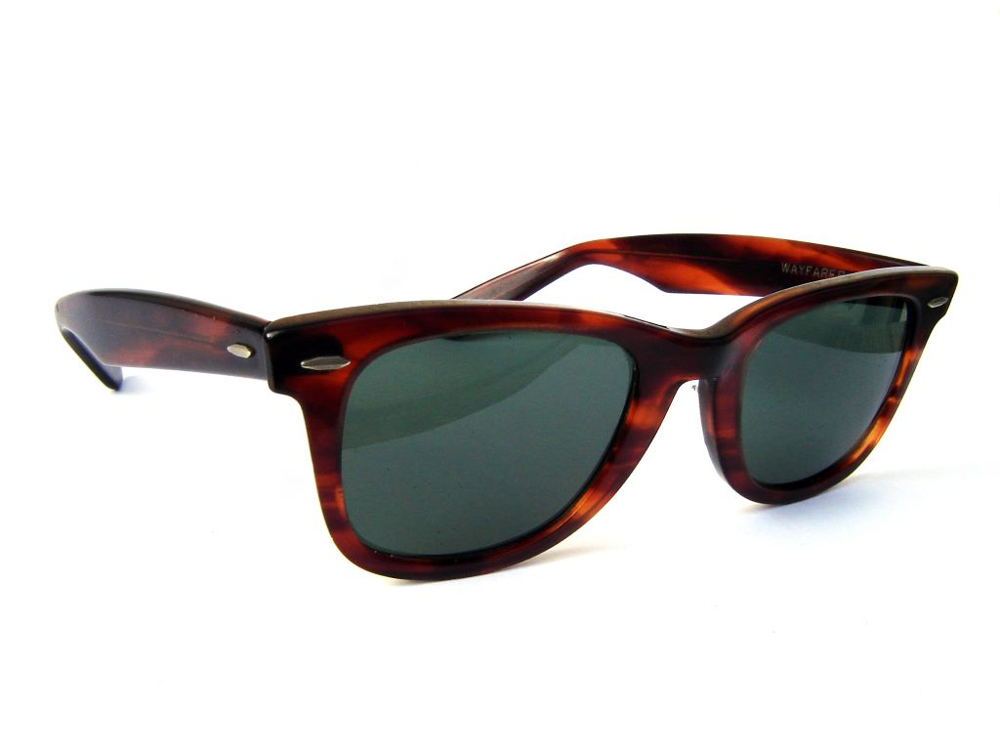

In [13]:
img

In [14]:
prompt = get_caption_florence2()
print(f"\033[1;31;34m{'*' * 40} Florence-2 detailed caption {'*' * 40}\n\n{prompt}")

**************************************** Florence-2 detailed caption ****************************************

The image is of a pair of sunglasses. The sunglasses have a tortoise shell frame with dark green lenses. The arms of the sunglasses are thin and curved, and the temples are slightly tapered. The brand name "Maui Jim" is visible on the temples. The background of the image is white.


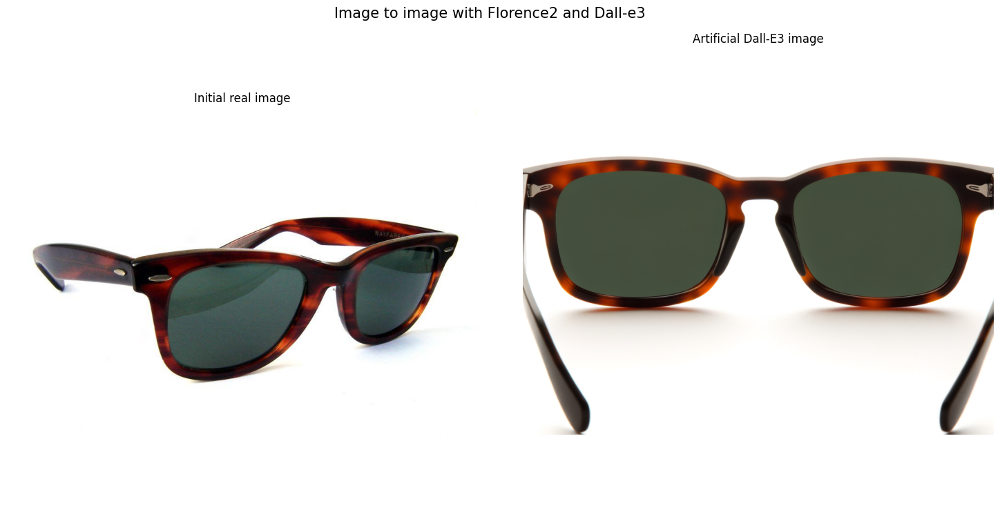

In [15]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
side_by_side(initial_image_file, dalle3_image_file)

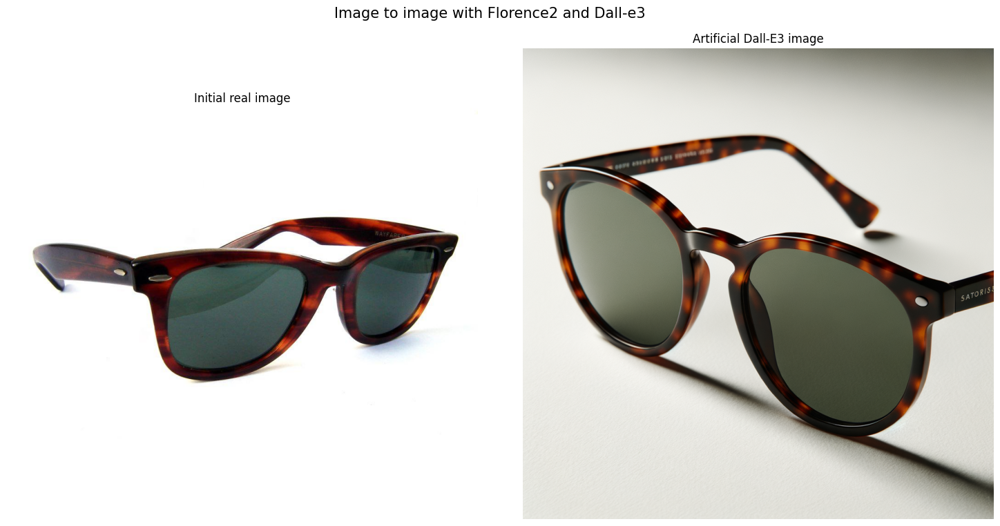

In [16]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
side_by_side(initial_image_file, dalle3_image_file)

### Test 2

In [36]:
url = "https://github.com/retkowsky/florence-2/blob/main/img%20(2).jpg?raw=true"

img = Image.open(requests.get(url, stream=True).raw)
img.save(initial_image_file)

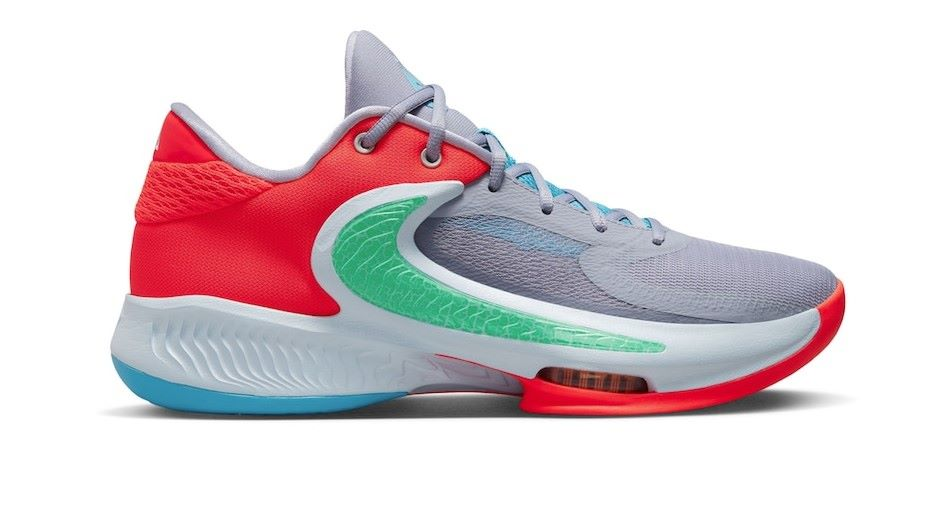

In [37]:
img

In [38]:
prompt = get_caption_florence2()
print(f"\033[1;31;34m{'*' * 40} Florence-2 detailed caption {'*' * 40}\n\n{prompt}")

**************************************** Florence-2 detailed caption ****************************************

The image is a photograph of a Nike basketball shoe. The shoe is predominantly grey with a red and blue accent on the heel. The upper part of the shoe is made of a combination of mesh and synthetic materials, with a grey midsole and a red outsole. The laces are grey and the tongue and heel are also grey. The Nike swoosh logo is visible on the side in red. The heel counter is also grey and has a red stripe running along the side. The outsole is blue and appears to be made of rubber. The overall design of the sneaker is modern and athletic.


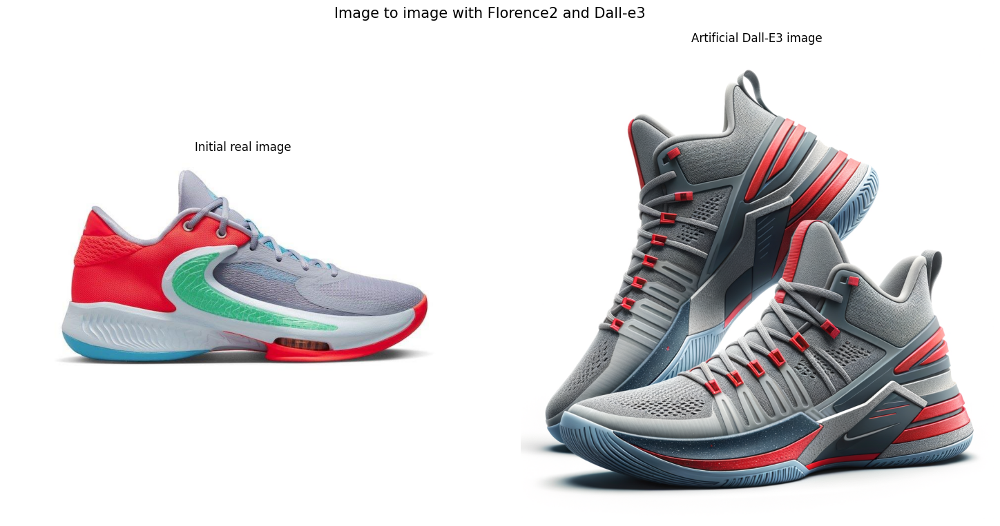

In [39]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
side_by_side(initial_image_file, dalle3_image_file)

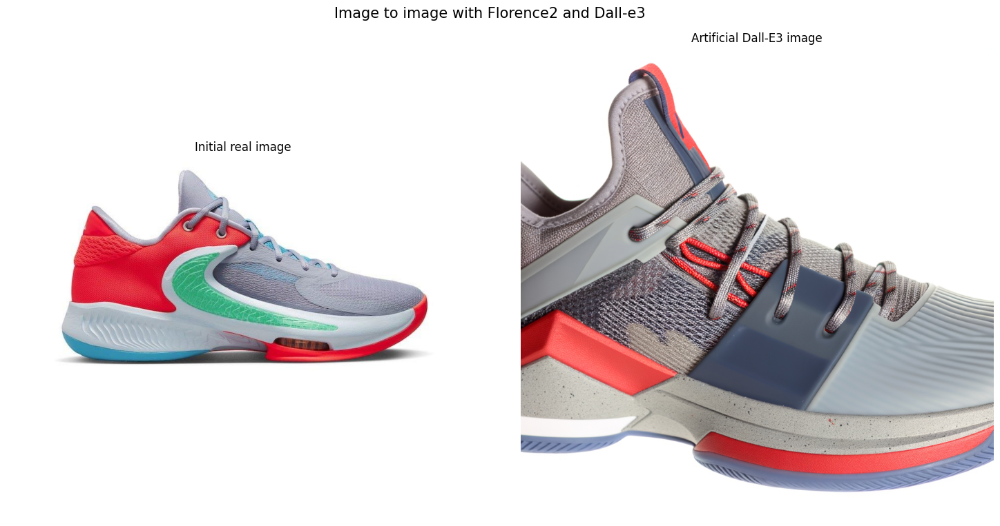

In [21]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
side_by_side(initial_image_file, dalle3_image_file)

## Test 3

In [32]:
url = "https://github.com/retkowsky/florence-2/blob/main/img%20(3).jpg?raw=true"

img = Image.open(requests.get(url, stream=True).raw)
img.save(initial_image_file)

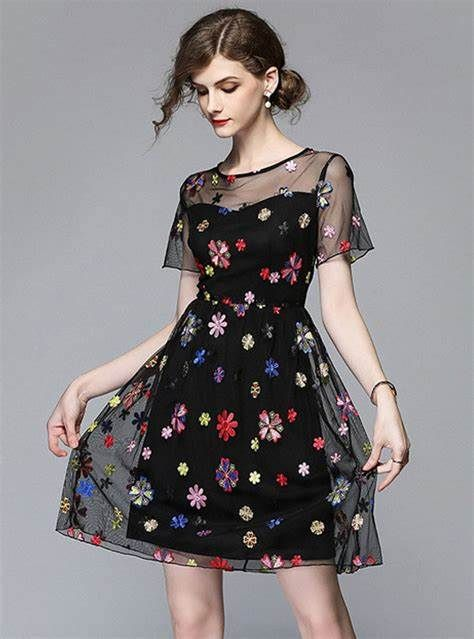

In [33]:
img

In [34]:
prompt = get_caption_florence2()
print(f"\033[1;31;34m{'*' * 40} Florence-2 detailed caption {'*' * 40}\n\n{prompt}")

**************************************** Florence-2 detailed caption ****************************************

The image shows a young woman wearing a black dress with colorful floral embroidery. The dress has a round neckline and short sleeves with sheer panels on the shoulders. The skirt of the dress is full and flows down to the floor. The woman has her hair styled in loose waves and is wearing a pair of statement earrings. She is posing with one hand on her hip and the other hand resting on her thigh. The background is a plain grey color.


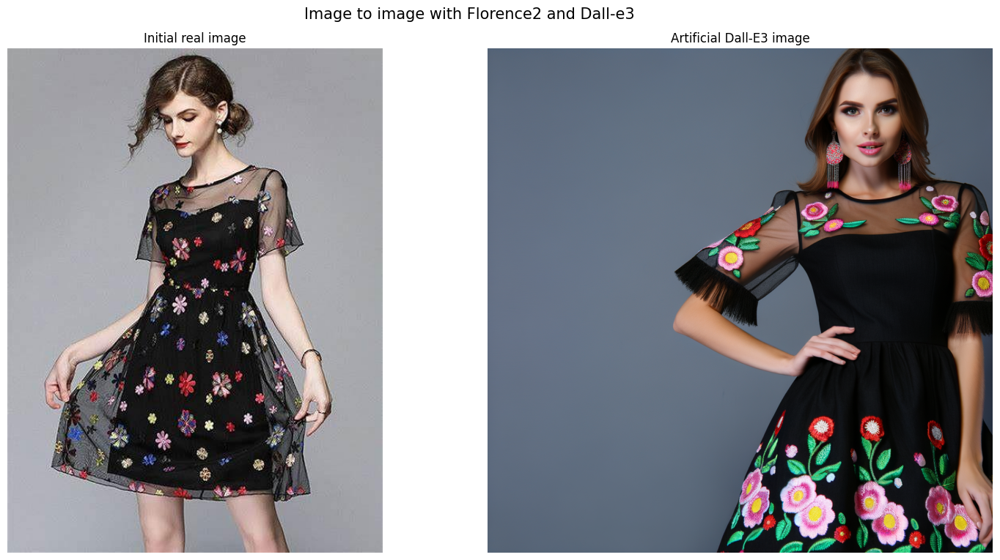

In [35]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
side_by_side(initial_image_file, dalle3_image_file)

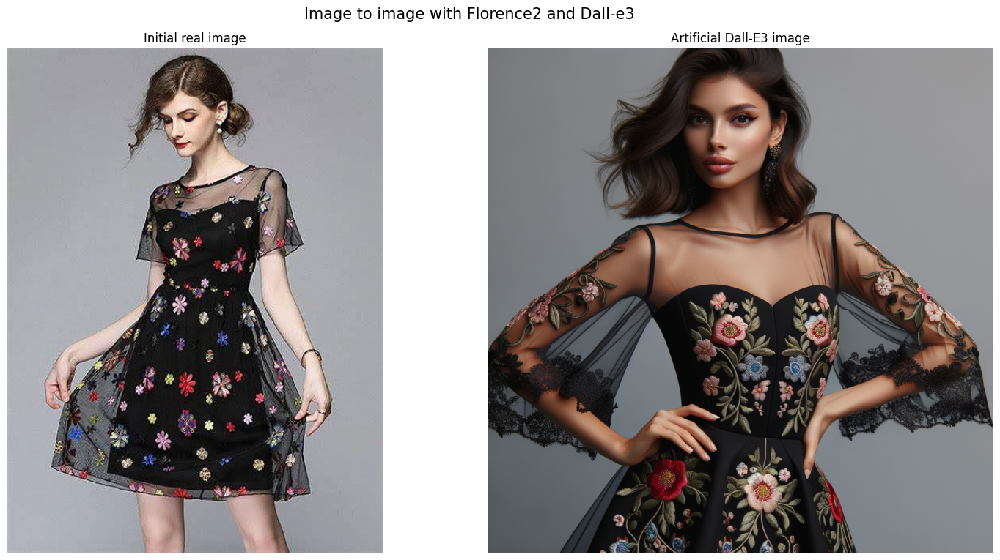

In [26]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="vivid")
side_by_side(initial_image_file, dalle3_image_file)

## Test 4

In [27]:
url = "https://github.com/retkowsky/florence-2/blob/main/img%20(4).jpg?raw=true"

img = Image.open(requests.get(url, stream=True).raw)
img.save(initial_image_file)

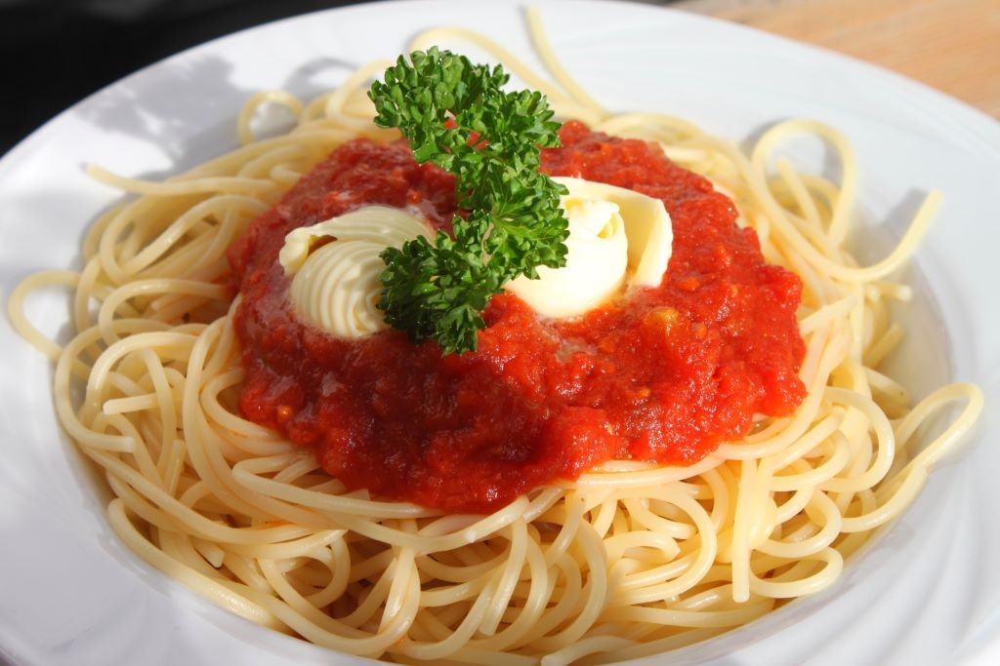

In [28]:
img

In [29]:
prompt = get_caption_florence2()
print(f"\033[1;31;34m{'*' * 40} Florence-2 detailed caption {'*' * 40}\n\n{prompt}")

**************************************** Florence-2 detailed caption ****************************************

The image shows a plate of spaghetti with tomato sauce and a dollop of sour cream on top. The spaghetti is cooked al dente and is arranged in a neat pile on a white plate. The sauce is a deep red color and appears to be thick and creamy. There is a sprig of fresh parsley on top of the sauce, adding a pop of green color to the dish. The plate is sitting on a wooden table, and the background is blurred, making the spaghetti and sauce the focal point of the image.


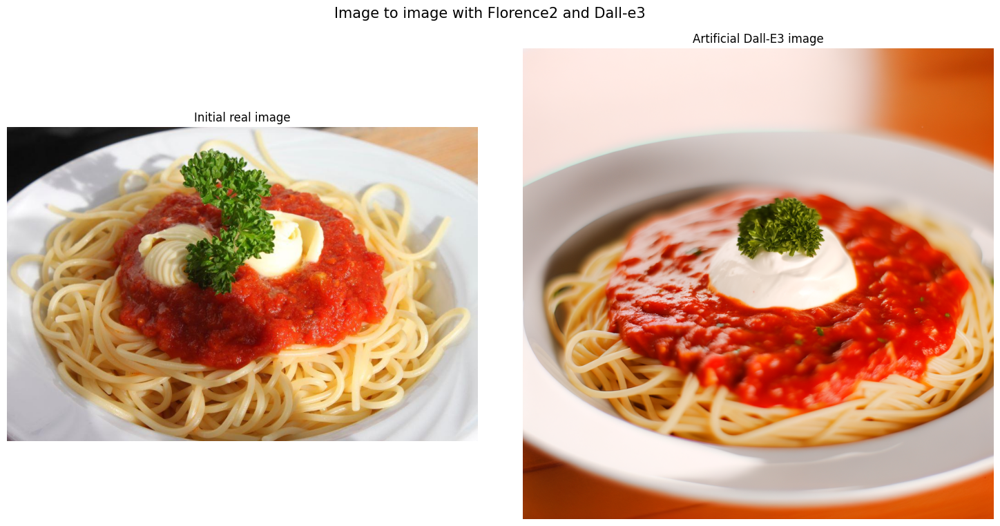

In [30]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
side_by_side(initial_image_file, dalle3_image_file)

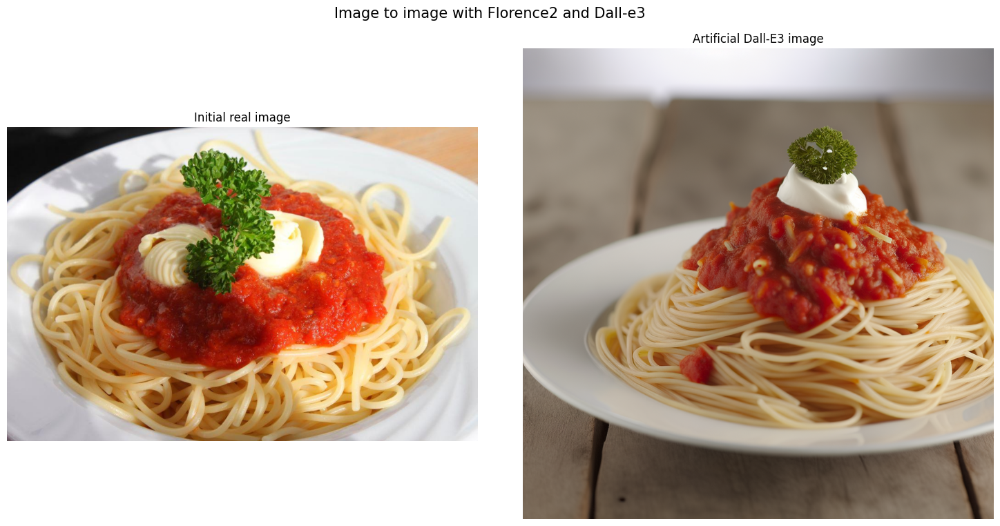

In [31]:
dalle3_image_file = dalle3(prompt, size="1024x1024", quality="hd", style="natural")
side_by_side(initial_image_file, dalle3_image_file)